In [13]:
%matplotlib inline
from matplotlib.animation import FuncAnimation
from matplotlib.patches import Arrow, Rectangle
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import HTML

In [2]:
![ ! -f puzzle.jpg ] && curl -s https://static1.squarespace.com/static/584040ffbe6594762f59f93a/t/5c34be050e2e721148d6baf7/1547502455261/omoplata+10+PUZZLE.jpg -o puzzle.jpg

# WHERE DOES IT END? WHERE DOES IT BEGIN?

![](puzzle.jpg)

follow the path

|  -  | 1 | 2 | 3 | 4 | 5 | 6 |
|-----|---|---|---|---|---|---|
|**A**| → | → | ⇊ | ↓ | → | ↓ |
|**B**| ↑ | ← | ⇉ | ← | ↑ | ↓ |
|**C**| → | ↑ | → | ⇈ | ↓ | ← |
|**D**| ↑ | ↓ | ⇇ | ← | → | ⇊ |
|**E**| ↓ | ← | ⇉ | ↑ | ↓ | → |
|**F**| ⇉ | ⇈ | ↑ | ↑ | ← | ↑ |

In [3]:
puzzle = ''.join('''→→⇊↓→↓
↑←⇉←↑↓
→↑→⇈↓←
↑↓⇇←→⇊
↓←⇉↑↓→
⇉⇈↑↑←↑'''.splitlines())

N = 6

In [4]:
def follow(puzzle, p=(0, 0), shape=(6, 6)):
    x, y = p
    path = []
    
    while x >= 0 and x < N and \
        y >= 0 and y < N and \
        p not in path:
        path.append(p)
        
        if puzzle[y * N + x] == "←":
            x, y = p = x - 1, y
        elif puzzle[y * N + x] == "⇇":
            x, y = p = x - 2, y
        elif puzzle[y * N + x] == "→":
            x, y = p = x + 1, y
        elif puzzle[y * N + x] == "⇉":
            x, y = p = x + 2, y
        elif puzzle[y * N + x] == "↑":
            x, y = p = x, y - 1
        elif puzzle[y * N + x] == "⇈":
            x, y = p = x, y - 2
        elif puzzle[y * N + x] == "↓":
            x, y = p = x, y + 1
        elif puzzle[y * N + x] == "⇊":
            x, y = p = x, y + 2
    
    return path

In [5]:
# The solution is the path that visits all squares
sol = [path for x in range(N) for y in range(6) for path in [follow(puzzle, (x, y))] if len(path) == N * N][0]

In [6]:
sol

[(1, 5),
 (1, 3),
 (1, 4),
 (0, 4),
 (0, 5),
 (2, 5),
 (2, 4),
 (4, 4),
 (4, 5),
 (3, 5),
 (3, 4),
 (3, 3),
 (2, 3),
 (0, 3),
 (0, 2),
 (1, 2),
 (1, 1),
 (0, 1),
 (0, 0),
 (1, 0),
 (2, 0),
 (2, 2),
 (3, 2),
 (3, 0),
 (3, 1),
 (2, 1),
 (4, 1),
 (4, 0),
 (5, 0),
 (5, 1),
 (5, 2),
 (4, 2),
 (4, 3),
 (5, 3),
 (5, 5),
 (5, 4)]

In [8]:
start_x, start_y = sol[0]
end_x, end_y = sol[-1]
print(f'{"ABCDEF"[start_y]}{start_x + 1}{"ABCDEF"[end_y]}{end_x + 1}')

F2E6


In [9]:
im = Image.open('puzzle.jpg')

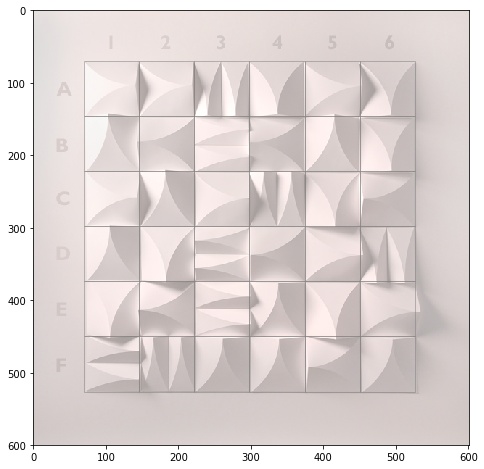

In [11]:
fig, ax = plt.subplots(figsize=(8, 8))

x0, y0 = 70, 70
square_size = 76

def arrows(z):
    arr_width = 10
    arr_patches = {
        '←': [Arrow(3 * square_size / 4, square_size / 2, -square_size / 2, 0, width=arr_width)],
        '⇇': [Arrow(3 * square_size / 4, square_size / 4, -square_size / 2, 0, width=arr_width),
              Arrow(3 * square_size / 4, 3 * square_size / 4, -square_size / 2, 0, width=arr_width)],
        '→': [Arrow(square_size / 4, square_size / 2, square_size / 2, 0, width=arr_width)],
        '⇉': [Arrow(square_size / 4, square_size / 4, square_size / 2, 0, width=arr_width),
              Arrow(square_size / 4, 3 * square_size / 4, square_size / 2, 0, width=arr_width)],
        '↑': [Arrow(square_size / 2, 3 * square_size / 4, 0, -square_size / 2, width=arr_width)],
        '⇈': [Arrow(square_size / 4, 3 * square_size / 4, 0, -square_size / 2, width=arr_width),
              Arrow(3 * square_size / 4, 3 * square_size / 4, 0, -square_size / 2, width=arr_width)],
        '↓': [Arrow(square_size / 2, square_size / 4, 0, square_size / 2, width=arr_width)],
        '⇊': [Arrow(square_size / 4, square_size / 4, 0, square_size / 2, width=arr_width),
              Arrow(3 * square_size / 4, square_size / 4, 0, square_size / 2, width=arr_width)]
    }
    return arr_patches[z]


def init_func():
    ax.imshow(im, alpha=.5)
    
    for y in range(N):
        for x in range(N):
            rect = Rectangle((x0 + square_size * x, y0 + square_size * y),
                             square_size, square_size,
                             linewidth=1, edgecolor='gray', facecolor='none', alpha=.5)
            ax.add_patch(rect)
            
    return []
    

def func(frame):
    x, y = frame
    z = puzzle[y * N + x]
    
    for arr in arrows(z):
        arr.set_facecolor('r')
        arr.set_linewidth(5)
        arr.get_transform().translate(x0 + square_size * x, y0 + square_size * y)
        ax.add_patch(arr)
        
    return []


anim = FuncAnimation(fig, func, sol, init_func, repeat=False, interval=400, save_count=0, blit=True);

In [14]:
HTML(anim.to_jshtml())